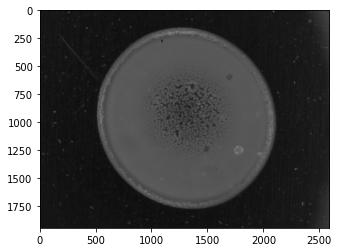

(2592, 1944)
(1944, 2592)


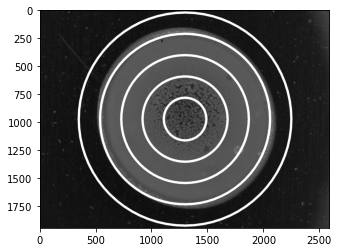

In [63]:
from pathlib import Path
# import sys
# import importlib
# importlib.reload(sys.modules['src.models'])
# project_dir = Path(__file__).resolve().parents[2]
# Extract pixels from the whole image
import numpy as np
from PIL import Image, ImageDraw
from matplotlib import pyplot as plt
import cv2

image_path = '../data/raw/220413/tiff/reflection'


img_origin = Image.open(image_path + '/dark_blue/220413A_X0p7_RWhite.tiff')
# display(img_origin)
plt.imshow(img_origin, cmap='gray', vmin=0, vmax=255)
plt.show()
print(img_origin.size)
print(np.array(img_origin).shape)
x, y, r = round(img_origin.size[0] / 2), round(img_origin.size[1] / 2), 190
img_origin = np.array(img_origin)
color = (255, 0, 0)
for i in range(5):
    cv2.circle(img_origin, (x,y), r * (i+1), color, 2*10)
# plt.title(title)
plt.imshow(img_origin, cmap='gray', vmin=0, vmax=255)
plt.show()

In [64]:
def extract_infor_circle(img_origin, x, y, r):
    img_arr = img_origin
#     print('img_arr is ', img_arr)
    h,w = img_arr.size[1], img_arr.size[0]
    lum_img = Image.new('L',[h,w] ,0)
    draw = ImageDraw.Draw(lum_img)

    leftUpPoint = (x-r, y-r)
    rightDownPoint = (x+r, y+r)
    twoPointList = [leftUpPoint, rightDownPoint]
    draw.ellipse(twoPointList, fill=255)
    lum_img_arr = np.array(lum_img)
#     print('shapes are', img_arr.size, lum_img_arr.shape, np.array(img_arr).shape, lum_img_arr)
    final_img_arr = np.dstack((np.array(img_arr).T, lum_img_arr))
#     print('final_img_arr shapes are', final_img_arr.size)
#     plt.imshow(Image.fromarray(final_img_arr))
#     plt.show()
    return final_img_arr

In [65]:
def draw_circles(img,circles, title):
    color = (255, 0, 0)
    # Line thickness of -1 px
    thickness = 10
#     if circles is not None:
#         circles = np.uint16(np.around(circles))
#         num = 0
#         for i in circles[0, :]:
#             # print('i is ', i)
#             num = num + 1
    img = np.array(img)
    cv2.circle(img, (circles[0], circles[1]), circles[2], color, 2*10)
#     plt.title(title)
#     plt.imshow(img)
#     plt.show()
    return img

In [66]:
def extract_circle_v2(image, height, width, first_ring, second_ring, only_one=True):
    centerX, centerY, radius = first_ring
    centerX2, centerY2, radius2 = second_ring
    canvas = np.zeros((height, width))
    # Draw the outer circle:
#     print('redius is ', radius, radius2)
    color = (255, 255, 255)
    thickness = -1
#     centerX = i[0]
#     centerY = i[1]
#     radius = i[2]
    if only_one:
        radius = radius2
        cv2.circle(canvas, (centerX, centerY), radius, color, thickness)
    else:
        cv2.circle(canvas, (centerX2, centerY2), radius2, color, thickness)
        color = (0, 0, 0)
        cv2.circle(canvas, (centerX, centerY), radius, color, thickness)

    # Create a copy of the input and mask input:
    imageCopy = image.copy()
    imageCopy[canvas == 0] = (0, 0, 0)

    # Crop the roi:
    x = centerX - radius
    y = centerY - radius
    h = 2 * radius
    w = 2 * radius
    if not only_one:
        x = centerX2 - radius2
        y = centerY2 - radius2
        h = 2 * radius2
        w = 2 * radius2
    croppedImg = imageCopy[y:y + h, x:x + w]
    return croppedImg


In [67]:
def main_lbp(data_dir):
#     i = 0
    vector_data = [[],[],[],[],[]]
    labels = []
    for image_file in data_dir.iterdir():
        lable = os.path.split(os.path.split(image_file)[0])[1]
        labels.append(lable)
#         if i > 1: 
#             break;
#         print(os.path.basename(image_file))
#         print(image_file)
        image = cv2.imread(str(image_file))
#         print(image.shape)
        x, y, r = round(image.shape[0] / 2), round(image.shape[1] / 2), 190
        height = image.shape[0]
        width = image.shape[1]
        fig = plt.figure(figsize=(50,10))
        ax  = fig.add_subplot(1,16,1)
        ax.set_title(os.path.basename(image_file))
        ax.imshow(image)
        fig_num = 1
        all_circle_data = []
        for j in range(5):
            merged_image = extract_circle_v2(image, height, width, (y, x, j*r), (y, x, (j+1)*r), False if j > 0 else True)
            imgLBP    = getLBPimage(merged_image, False)
#             if j == 1:
            vector_data[j].append(imgLBP)
            vecimgLBP = imgLBP.flatten()
#             ax.set_title("gray scale image")
            fig_num += 1
            ax  = fig.add_subplot(1,16,fig_num)
            ax.imshow(Image.fromarray(merged_image))
            ax.set_title("gray scale image")
            fig_num += 1
            ax  = fig.add_subplot(1,16,fig_num)
            ax.imshow(Image.fromarray(imgLBP))
            ax.set_title("LBP image")
            fig_num += 1
            ax  = fig.add_subplot(1,16,fig_num)
            freq,lbp, _ = ax.hist(vecimgLBP,bins=2**8)
            ax.set_ylim(0,100000)
            lbp = lbp[:-1]
            ax.set_title("LBP histogram" + str((j+1)*r))
        plt.show()
        
    return vector_data, labels
#         i += 1

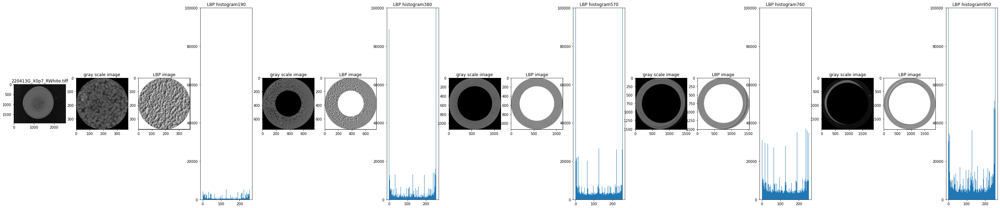

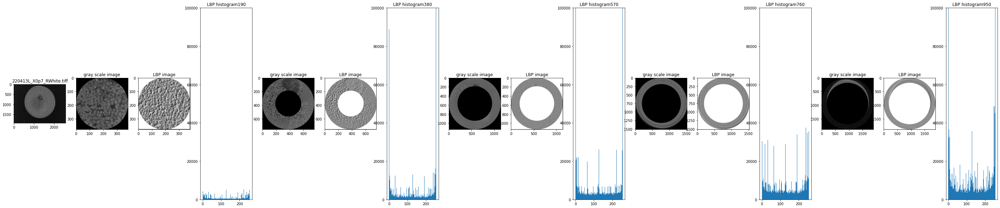

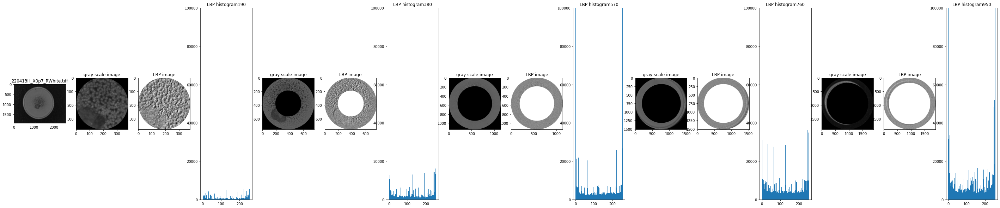

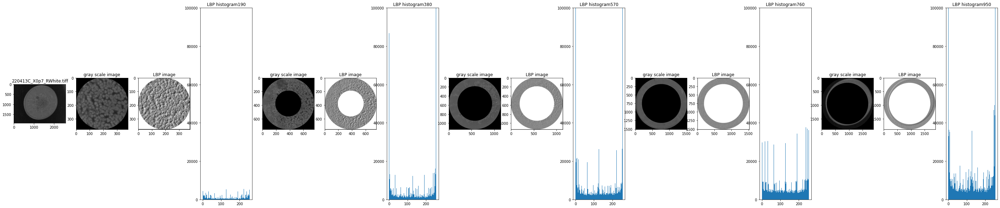

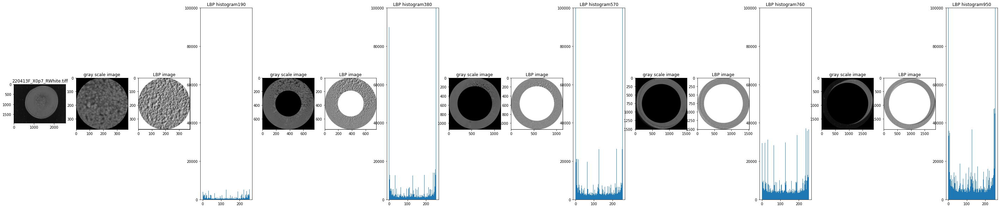

...

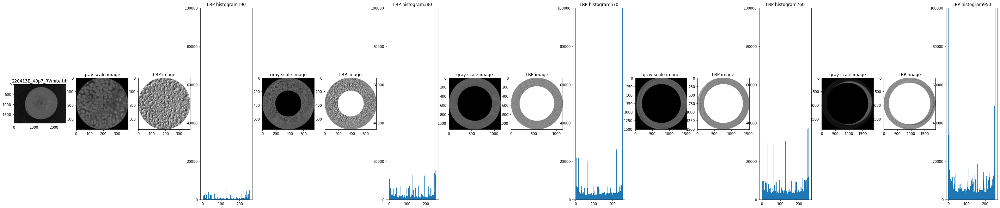

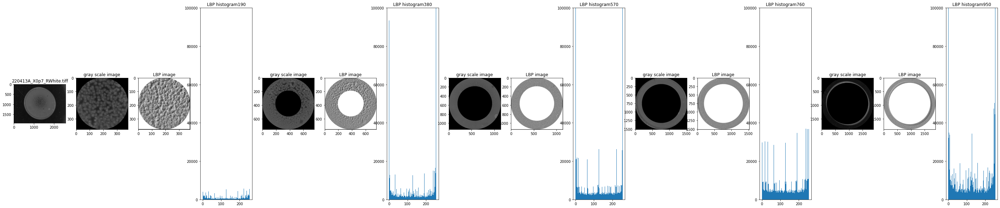

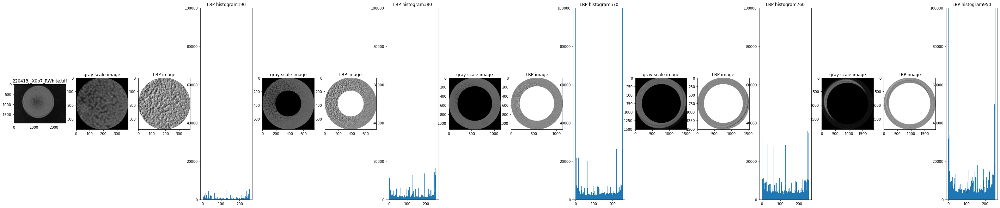

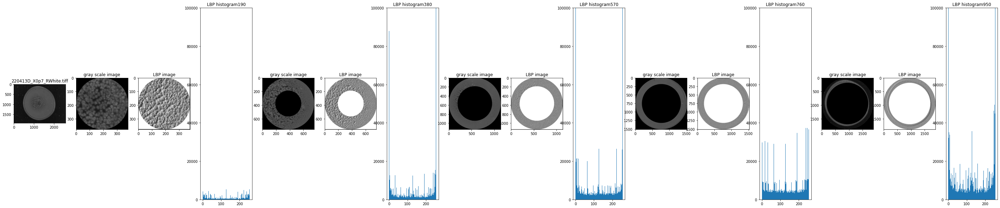

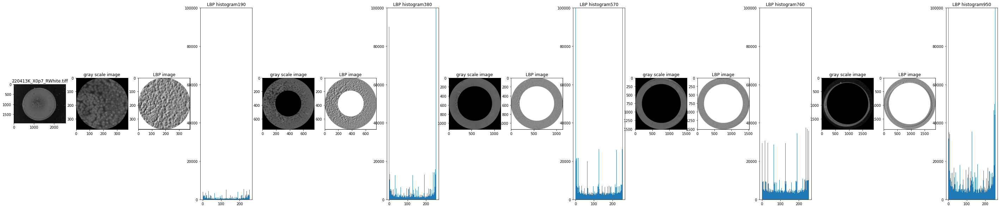

In [68]:
import os
from src.features.build_features import getLBPimage
import cv2

__file__ = os.path.abspath('')

project_dir = Path(__file__).resolve()


dark_blue = Path(str(project_dir) + '/../data/raw/220413/tiff/reflection/dark_blue').resolve()

db_data, db_labels = main_lbp(dark_blue)

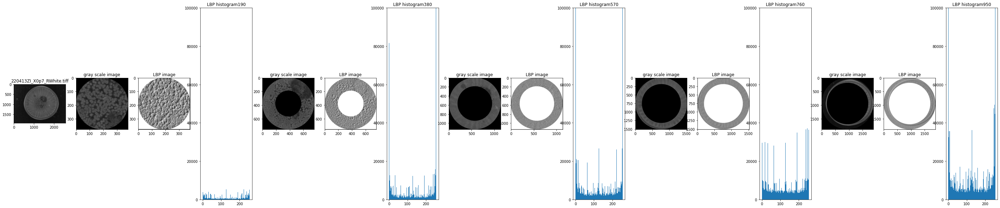

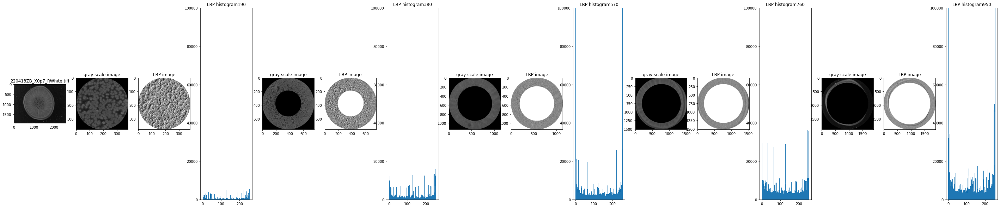

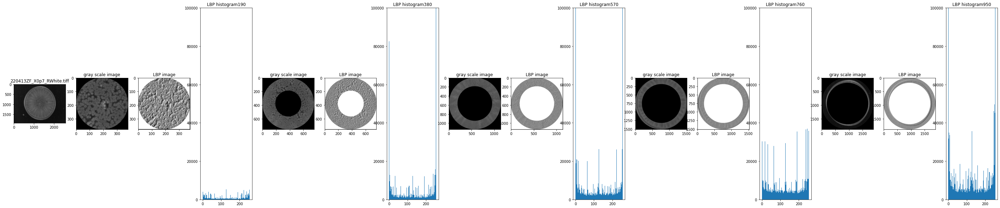

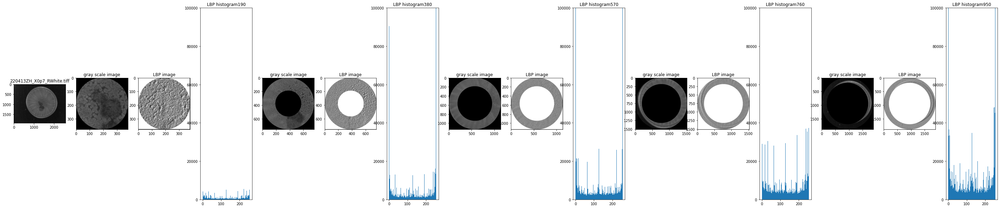

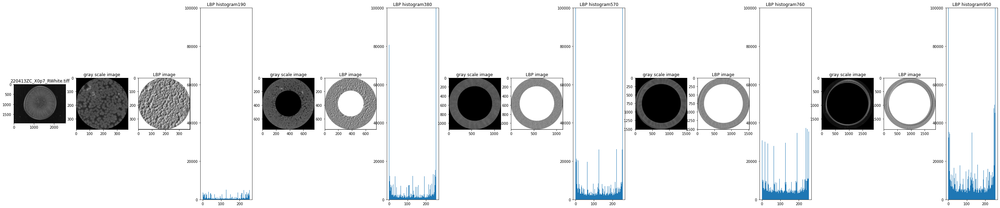

...

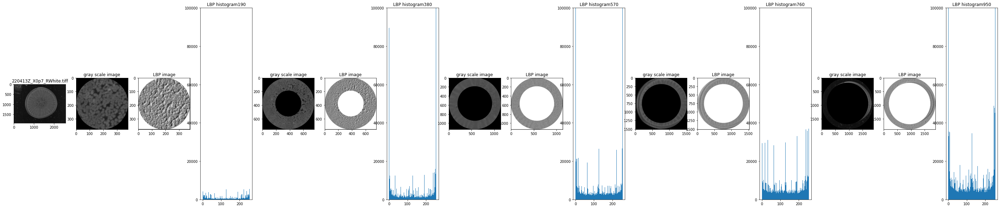

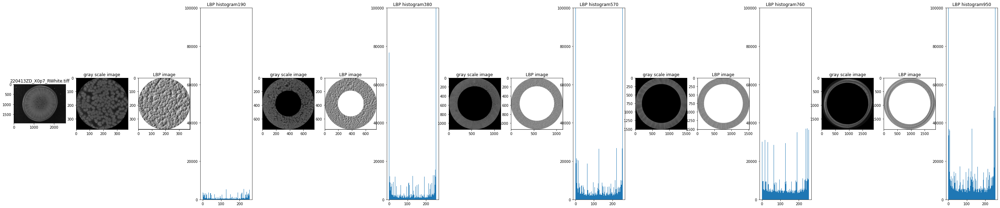

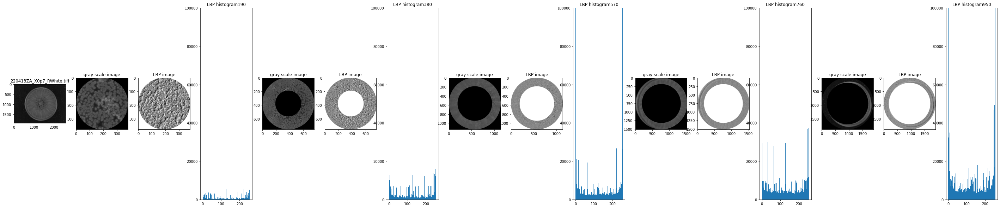

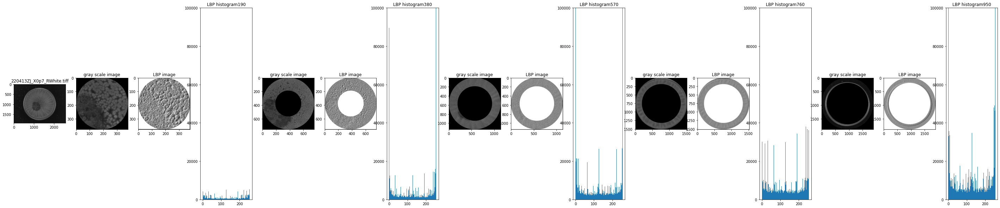

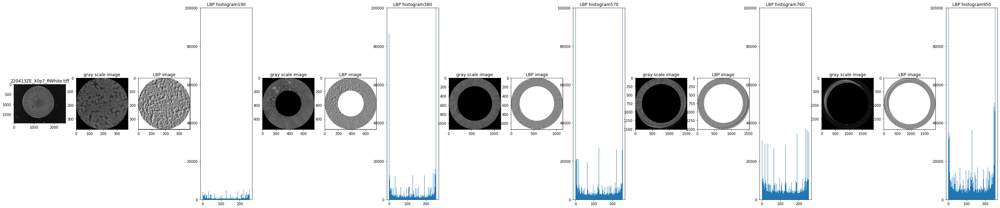

In [69]:
dbm_path = Path(str(project_dir) + '/../data/raw/220413/tiff/reflection/dbm_gm').resolve()


dbm_data, dbm_labels = main_lbp(dbm_path)

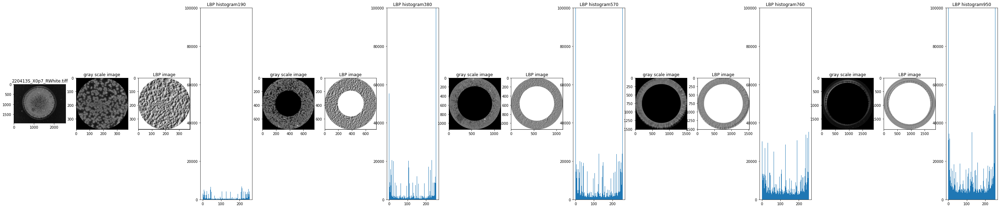

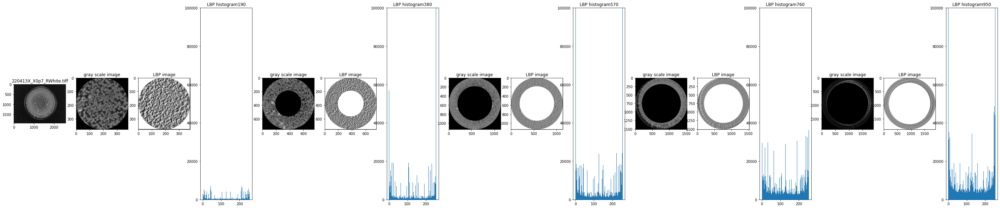

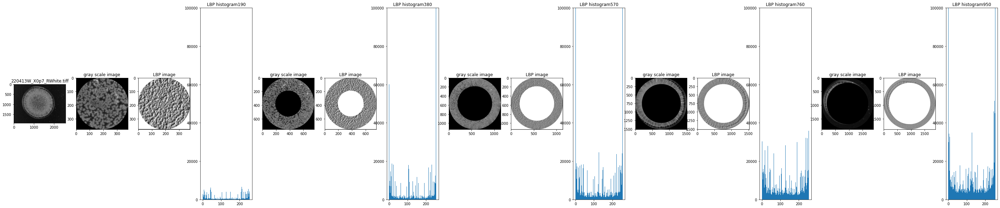

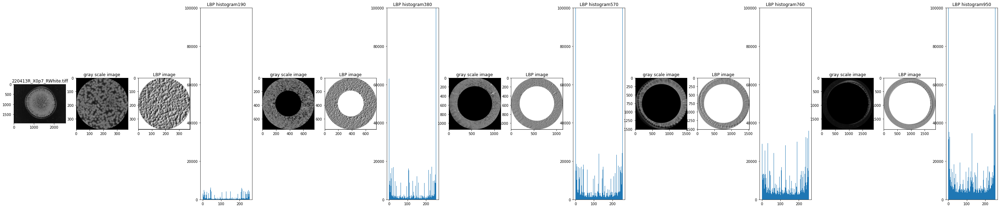

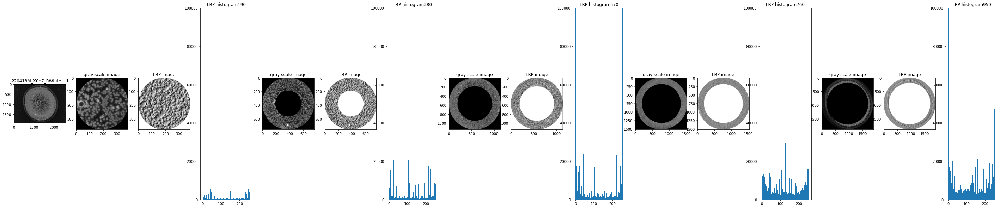

...

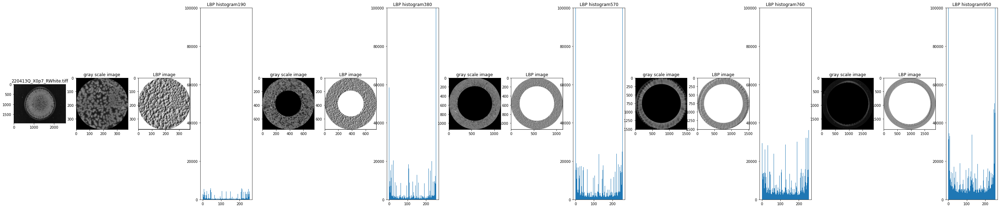

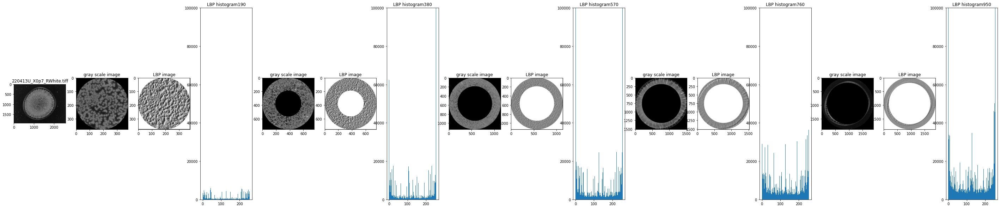

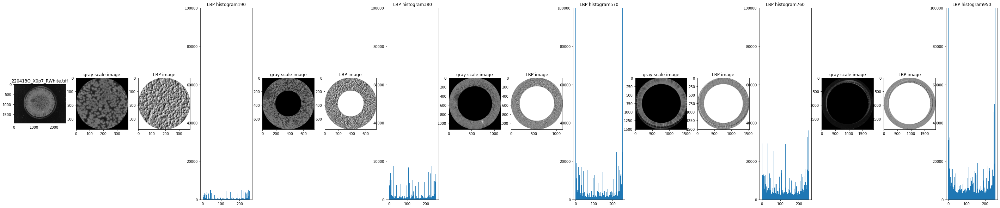

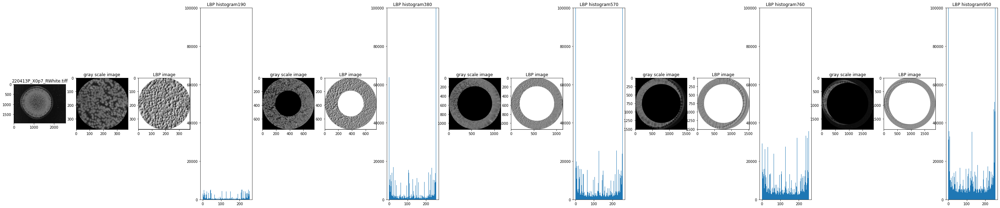

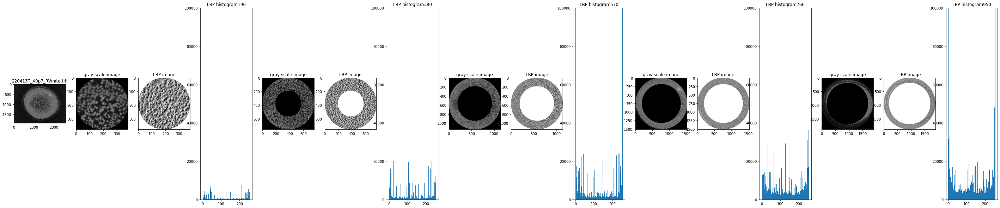

In [70]:
green_trim = Path(str(project_dir) + '/../data/raw/220413/tiff/reflection/green_trim').resolve()


gt_data, gt_labels =main_lbp(green_trim)

In [75]:
for i in range(5):
    all_vector_data[i] = db_data[i] + dbm_data[i] + gt_data[i]
all_labels = db_labels + dbm_labels + gt_labels

In [76]:
def preprocess_data(data, labels):
    data = np.array(data)
    lables = np.array(labels)
    le = LabelEncoder()
    lables = le.fit_transform(labels)
    # myset = set(lables)
    dataset_size = data.shape[0]
    data = data.reshape(dataset_size, -1)
    # print(data.shape)
    # print(lables.shape)
    # print(dataset_size)
    trainX, testX, trainY, testY = train_test_split(data, lables, test_size=0.2, shuffle=True)
    return trainX, testX, trainY, testY, le


In [77]:
from src.models.train_model import train_test_cls
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import  train_test_split
from sklearn.metrics import classification_report
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

for i in range(5):
    print('The ', i, ' th circle:')
    data, labels = all_vector_data[i],  all_labels
#     print(len(data), len(labels))
    trainX, testX, trainY, testY, le = preprocess_data(data, labels)
    print(len(trainX[0]), len(testX))
#     print(trainY, testY)
    cls = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
    print('The results of KNeighborsClassifier:')
    print(results)

    cls = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
     max_depth=1, random_state=0)
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
    print('The results of GradientBoostingClassifier:')
    print(results)

    cls = DecisionTreeClassifier(random_state=0)
    results = train_test_cls(trainX, testX, trainY, testY, cls, le)
    print('The results of DecisionTreeClassifier:')
    print(results)

The  0  th circle:
433200 8


/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of KNeighborsClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         4
      dbm_gm       0.00      0.00      0.00         2
  green_trim       0.25      1.00      0.40         2

    accuracy                           0.25         8
   macro avg       0.08      0.33      0.13         8
weighted avg       0.06      0.25      0.10         8

The results of GradientBoostingClassifier:
              precision    recall  f1-score   support

   dark_blue       1.00      0.25      0.40         4
      dbm_gm       0.20      0.50      0.29         2
  green_trim       0.50      0.50      0.50         2

    accuracy                           0.38         8
   macro avg       0.57      0.42      0.40         8
weighted avg       0.68      0.38      0.40         8

The results of DecisionTreeClassifier:
              precision    recall  f1-score   support

   dark_blue       1.00      0.50      0.67         4
      dbm_

/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of KNeighborsClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         2
      dbm_gm       0.00      0.00      0.00         1
  green_trim       0.62      1.00      0.77         5

    accuracy                           0.62         8
   macro avg       0.21      0.33      0.26         8
weighted avg       0.39      0.62      0.48         8

The results of GradientBoostingClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         2
      dbm_gm       0.25      1.00      0.40         1
  green_trim       1.00      0.40      0.57         5

    accuracy                           0.38         8
   macro avg       0.42      0.47      0.32         8
weighted avg       0.66      0.38      0.41         8



/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of DecisionTreeClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         2
      dbm_gm       0.20      1.00      0.33         1
  green_trim       0.00      0.00      0.00         5

    accuracy                           0.12         8
   macro avg       0.07      0.33      0.11         8
weighted avg       0.03      0.12      0.04         8

The  2  th circle:
3898800 8


/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of KNeighborsClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         3
      dbm_gm       0.00      0.00      0.00         3
  green_trim       0.25      1.00      0.40         2

    accuracy                           0.25         8
   macro avg       0.08      0.33      0.13         8
weighted avg       0.06      0.25      0.10         8



/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of GradientBoostingClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         3
      dbm_gm       0.20      0.33      0.25         3
  green_trim       0.00      0.00      0.00         2

    accuracy                           0.12         8
   macro avg       0.07      0.11      0.08         8
weighted avg       0.08      0.12      0.09         8

The results of DecisionTreeClassifier:
              precision    recall  f1-score   support

   dark_blue       0.50      0.33      0.40         3
      dbm_gm       0.50      0.33      0.40         3
  green_trim       0.00      0.00      0.00         2

    accuracy                           0.25         8
   macro avg       0.33      0.22      0.27         8
weighted avg       0.38      0.25      0.30         8

The  3  th circle:
6931200 8


/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of KNeighborsClassifier:
              precision    recall  f1-score   support

   dark_blue       0.00      0.00      0.00         3
      dbm_gm       0.00      0.00      0.00         2
  green_trim       0.38      1.00      0.55         3

    accuracy                           0.38         8
   macro avg       0.12      0.33      0.18         8
weighted avg       0.14      0.38      0.20         8

The results of GradientBoostingClassifier:
              precision    recall  f1-score   support

   dark_blue       0.33      0.33      0.33         3
      dbm_gm       0.00      0.00      0.00         2
  green_trim       0.00      0.00      0.00         3

    accuracy                           0.12         8
   macro avg       0.11      0.11      0.11         8
weighted avg       0.12      0.12      0.12         8

The results of DecisionTreeClassifier:
              precision    recall  f1-score   support

   dark_blue       0.33      0.33      0.33         3
      dbm_

/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of KNeighborsClassifier:
              precision    recall  f1-score   support

   dark_blue       0.50      0.20      0.29         5
      dbm_gm       0.00      0.00      0.00         2
  green_trim       0.17      1.00      0.29         1

    accuracy                           0.25         8
   macro avg       0.22      0.40      0.19         8
weighted avg       0.33      0.25      0.21         8



/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bruceliu/projects/milk_cls/venv/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

The results of GradientBoostingClassifier:
              precision    recall  f1-score   support

   dark_blue       0.60      0.60      0.60         5
      dbm_gm       0.33      0.50      0.40         2
  green_trim       0.00      0.00      0.00         1

    accuracy                           0.50         8
   macro avg       0.31      0.37      0.33         8
weighted avg       0.46      0.50      0.47         8

The results of DecisionTreeClassifier:
              precision    recall  f1-score   support

   dark_blue       0.50      0.40      0.44         5
      dbm_gm       0.00      0.00      0.00         2
  green_trim       1.00      1.00      1.00         1

    accuracy                           0.38         8
   macro avg       0.50      0.47      0.48         8
weighted avg       0.44      0.38      0.40         8

